## Домашняя работа #3.

Отправлять ссылку через форму нужно только один раз. Исправления вносятся в тот же ноутбук до хард-дедлайна и помечаются комментариями в коде и комментариями к соотвествующим ячейкам.

Материалы к домашке доступны по ссылке:
https://drive.google.com/drive/folders/1dNoAOMcrRyuf_3vS1LTPpdyrqYxgvPOy?usp=sharing



Большая домашка с увеличенным баллом и временем до дедлайна.
* Морфлогия.
* Фильтры габора.
* Цветовые гистрограммы.
* Гистограммы градиентов.

МОАД5 (ИТМО6)

**Soft deadline: 12.04.2023 (05.04.2023) 03:00:00 +0003 GMT**

**Hard deadline: 19.04.2023 (12.04.2023) 03:00:00 +0003 GMT**

In [ ]:
# ПРИМОНТИРУЙТЕ ДИСК К НОУТБУКУ
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from pathlib import Path
# ИЗМЕНИТЕ ЭТОТ ПУТЬ НА ТОТ, КУДА ВЫ ПОЛОЖИЛИ МАТЕРИАЛЫ КУРСА
sources_path = Path("/content/drive/MyDrive/homework3-materials")

In [ ]:
import cv2
import numpy as np
import matplotlib.pylab as plt
%matplotlib inline
plt.style.use('default')

def pyplot(func):
    def make_pyplot_context(*args, **kwargs):
        plt.figure(figsize=kwargs.get('size', (10, 5)))
        ax = plt.axes([0,0,1,1], frameon=False)
        ax.set_axis_off()
        return func(*args, **kwargs)
    return make_pyplot_context

@pyplot
def show_bgr(img, size=(10, 5)):
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

@pyplot
def show_gray(img, size=(10, 5)):
    plt.imshow(img, cmap='gray')

def mse(img1, img2):
    return ((img1.astype(int) - img2.astype(int)) ** 2).mean()

# МОРФОЛОГИЯ

### 1 задание

**1. (5 баллов)** Выделите в изображении $table.jpg$ границы таблицы с использованием морфологических операций. Результатом обработки должно бытьn изображение, в котором удален весь текст и оставлены только границы таблицы.

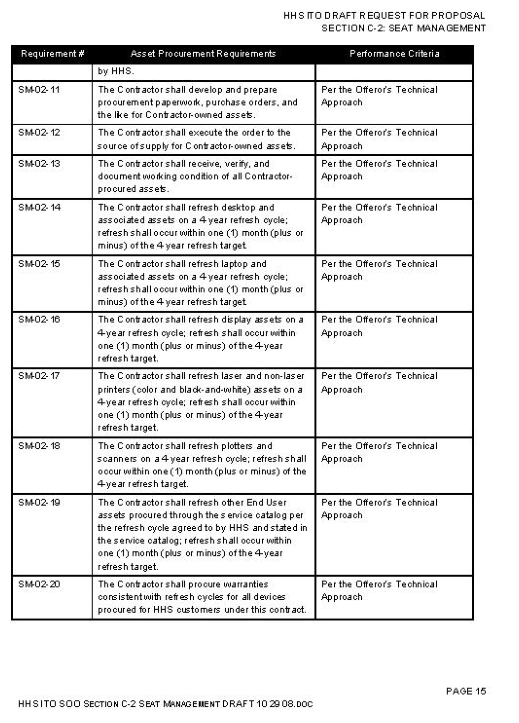

In [ ]:
table = cv2.imread(str(sources_path / "table.jpg"), 0)
show_gray(table, size=(5, 10))

Бинаризация изображения:

In [ ]:
th, img = cv2.threshold(table, 127, 255, cv2.THRESH_BINARY)
img = cv2.bitwise_not(img)

Добавим паддинг:

In [ ]:
padded = np.pad(img, 5)

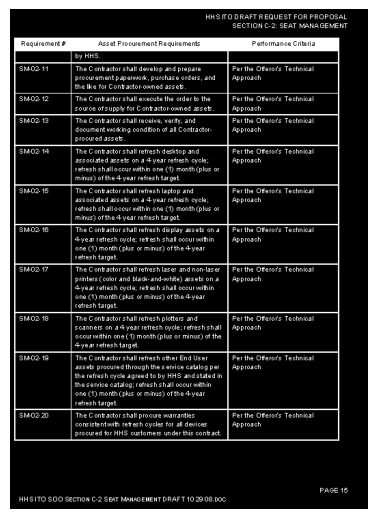

In [ ]:
show_gray(padded)

Структурные элементы:

In [ ]:
kernel_square = np.ones((3,3), np.uint8)

In [ ]:
kernel_line1 = np.ones((1, 110), np.uint8)

In [ ]:
kernel_line2 = np.ones((1,109), np.uint8)

Хотим избавиться от буковок в заголовке таблицы, поэтому делаем closing

In [ ]:
close = cv2.morphologyEx(padded, cv2.MORPH_CLOSE, kernel_square, iterations=1)

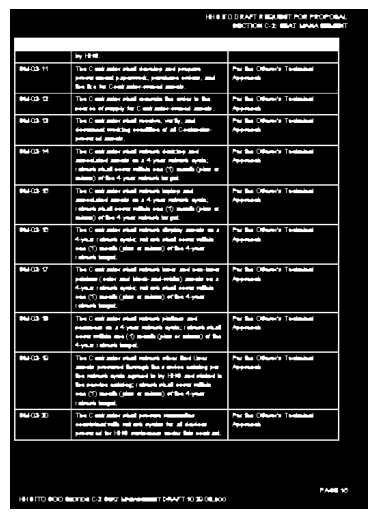

In [ ]:
show_gray(close)

In [ ]:
horisontal = cv2.dilate(cv2.erode(close, kernel_line1), kernel_line2)
vertical = cv2.dilate(cv2.erode(close, kernel_line1.T), kernel_line2.T)

In [ ]:
res = cv2.bitwise_or(horisontal, vertical)

In [ ]:
out = img = cv2.bitwise_not(res)

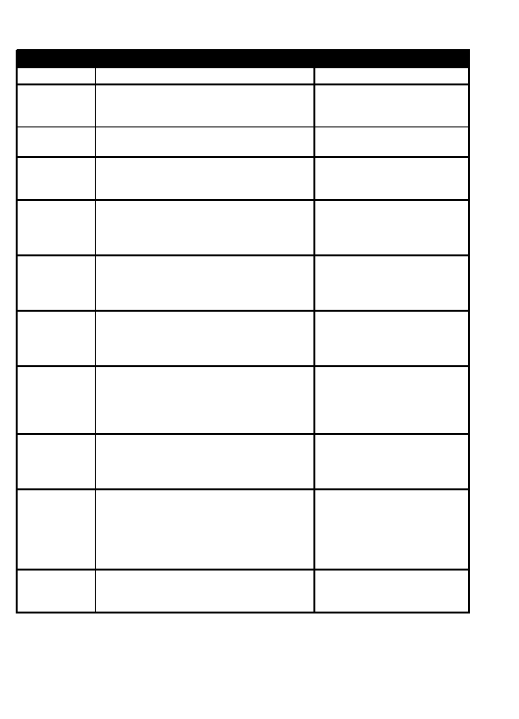

In [ ]:
show_gray(out, size=(5, 10))

### 2 задание

**2. (5 баллов)** Для изображения $circles.jpg$ реализуйте морфологический алгоритм для построения трех изображений, которые бы содержали соответственно:

* только частицы, касающиеся краев изображения,

* только группы перекрывающихся частиц,

* только одиночные круглые частицы.

Посчитайте число частиц и групп на каждом изображении. Раскрастье отдельные компоненты с помощью функции.

In [ ]:
import math

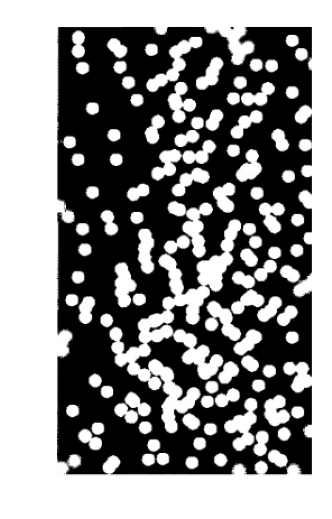

In [ ]:
circles = cv2.imread(str(sources_path / "circles.png"), 0)
show_gray(circles)

In [ ]:
th, img = cv2.threshold(circles, 127, 255, cv2.THRESH_BINARY)

In [ ]:
kernel = np.hstack((cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(3,3)), np.ones((3, 14))))
kernel = kernel.astype('uint8')

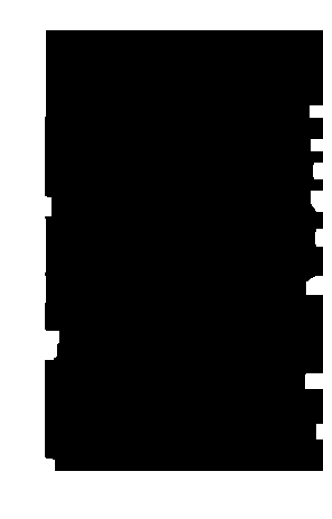

In [ ]:
show_gray(cv2.dilate(cv2.erode(img, kernel, iterations=2), np.ones((11,11))))

Contours

In [ ]:
contours, hierarchy = cv2.findContours(img, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

In [ ]:
circle_area = 90
overlap_cnt = 0
single_cnt = 0
overlap_res = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
single_res = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)

In [ ]:
for c in contours:
  s = cv2.contourArea(c)

In [ ]:
for i, c in enumerate(contours):
  s = cv2.contourArea(c)
  q = math.ceil(s / circle_area)
  q1 = math.floor(s / circle_area)
  if q > 1:
    overlap_cnt += 1
    cv2.drawContours(overlap_res, contours, i, (0,255,0), 2)

In [ ]:
print(overlap_cnt)

53


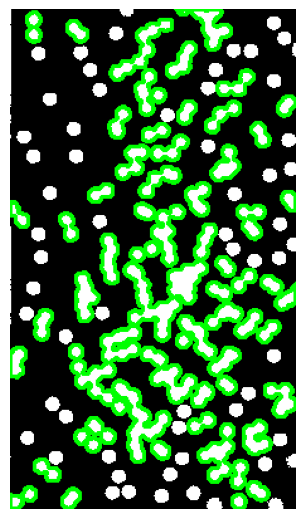

In [ ]:
show_bgr(overlap_res)

## Задание 3

**3. (5 баллов)** **Watershed**

* Возьмите изображения: *coins_1.jpg*, *coins_noize_1.jpg*
* Примените к ним алгоритм водораздела, чтобы посчитать монетки
* отсоритруйте монетки по размеру и у каждой моентки в центре впишите порядковое число

В сниппете кода содержится подсказка о том, какие функции стоит поприменять.

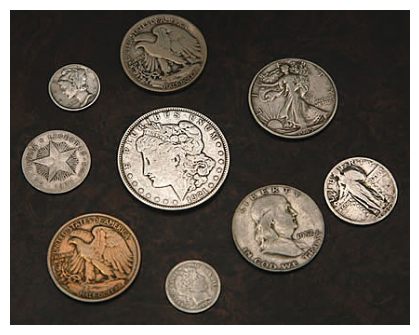

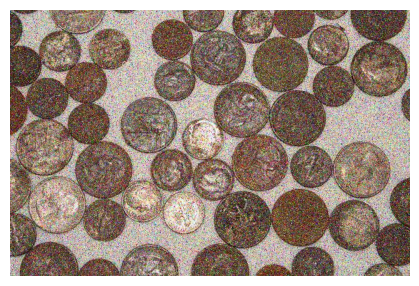

In [ ]:
from skimage.feature import peak_local_max
from skimage.segmentation import watershed
import scipy
from scipy.ndimage import distance_transform_edt
from scipy.ndimage import label
from cv2 import pyrMeanShiftFiltering
import imutils
coins_1 = cv2.imread(str(sources_path / "coins_1.jpg"))
show_bgr(coins_1, size=(4, 5))
coins_2 = cv2.imread(str(sources_path / "coins_noize_1.jpg"))
show_bgr(coins_2, size=(4, 5))

### coins_1

In [ ]:
shifted = pyrMeanShiftFiltering(coins_1, 10, 75)
coins_gray = cv2.cvtColor(shifted, cv2.COLOR_RGB2GRAY)
_, thresh = cv2.threshold(coins_gray, 60, 255, cv2.THRESH_BINARY)
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(5,5))
thresh = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel)

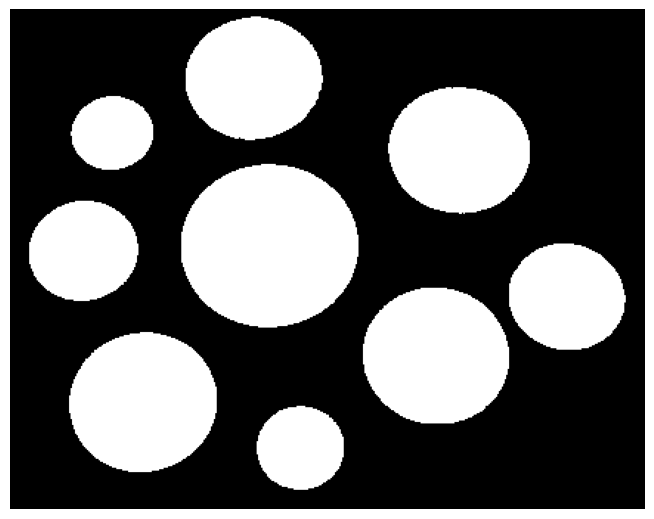

In [ ]:
show_gray(thresh)

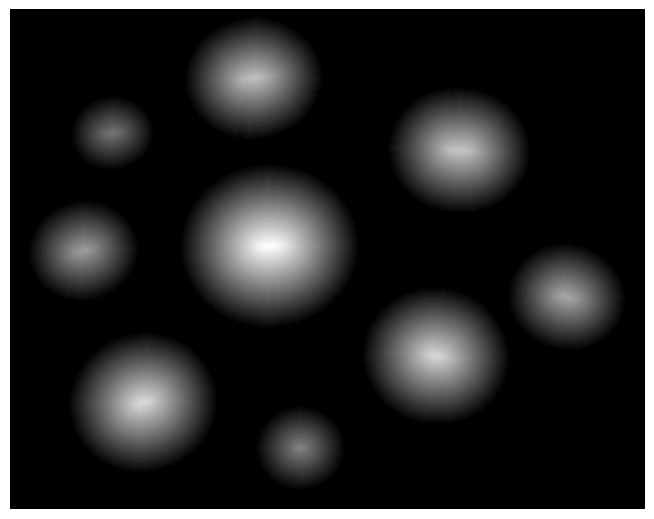

In [ ]:
distance = distance_transform_edt(thresh)
show_gray(distance)

In [ ]:
localMax = peak_local_max(distance, min_distance=20)

In [ ]:
mask = np.zeros(distance.shape, dtype=bool)
mask[tuple(localMax.T)] = True
markers = label(mask)[0]

In [ ]:
labels = watershed(-distance, markers, mask=thresh)

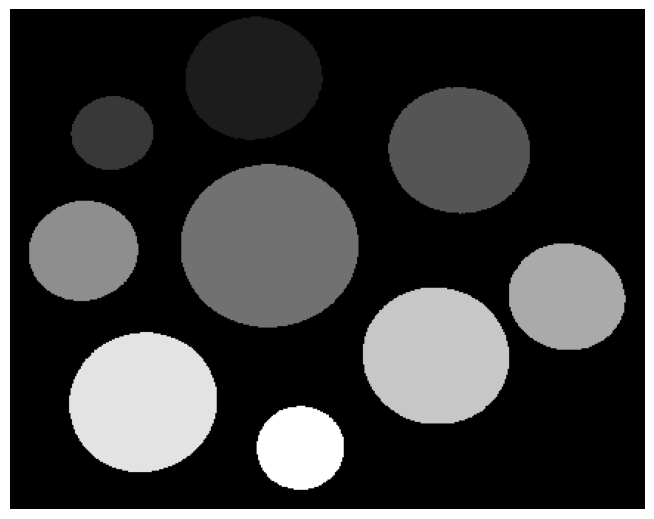

In [ ]:
show_gray(labels)

In [ ]:
img = np.array(coins_1, copy=True)

In [ ]:
coins = []
for label in np.unique(labels):
    if label:
        mask = np.zeros(coins_gray.shape, dtype="uint8")
        mask[labels == label] = 255
        cnts = cv2.findContours(mask.copy(), cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)
        cnts = imutils.grab_contours(cnts)
        c = max(cnts, key=cv2.contourArea)
        ((x, y), r) = cv2.minEnclosingCircle(c)
        coins.append((r, x, y))
        cv2.circle(img, (int(x), int(y)), int(r), (0, 255, 0), 2)

In [ ]:
coins = sorted(coins, key=lambda x: x[0], reverse=True)
for i, (r, x, y) in enumerate(coins, 1):
    cv2.putText(img, f"{i}", (int(x) - 10, int(y) + 10), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2)

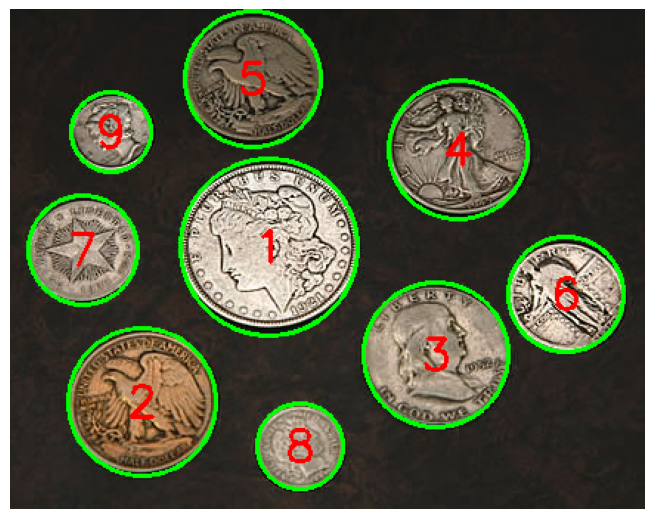

In [ ]:
show_bgr(img)

### coins_2

In [ ]:
from scipy.ndimage import label

In [ ]:
def get_watershed(img):
  img = np.array(img, copy=True)
  denoised = cv2.fastNlMeansDenoisingColored(coins_2,None,30,30,7,21)
  th, img = cv2.threshold(cv2.cvtColor(denoised, cv2.COLOR_RGB2GRAY), 150, 255, cv2.THRESH_BINARY)
  img = cv2.bitwise_not(img)
  kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(9, 9))
  opening = cv2.morphologyEx(img,cv2.MORPH_OPEN,kernel, iterations = 5)
  distance = distance_transform_edt(opening)
  localMax = peak_local_max(distance, min_distance=10, labels=opening)
  mask = np.zeros(distance.shape, dtype=bool)
  mask[tuple(localMax.T)] = True
  markers = label(mask)[0]
  labels = watershed(-distance, markers, mask=opening)
  show_gray(labels)
  return labels

In [ ]:
def draw_coins(img, watershed):
  img = np.array(img, copy=True)
  coins = []
  for l in np.unique(labels):
    if l:
        mask = np.zeros(coins_gray.shape, dtype="uint8")
        mask[labels == l] = 255
        cnts = cv2.findContours(mask.copy(), cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)
        cnts = imutils.grab_contours(cnts)
        c = max(cnts, key=cv2.contourArea)
        ((x, y), r) = cv2.minEnclosingCircle(c)
        if 20 <= r <= 60:
          coins.append((r, x, y))
          cv2.circle(img, (int(x), int(y)), int(r), (0, 255, 0), 2)

  coins = sorted(coins, key=lambda x: x[0], reverse=True)
  for i, (r, x, y) in enumerate(coins, 1):
      cv2.putText(img, f"{i}", (int(x) - 10, int(y) + 10), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2)
  print(f'Coins num: {i}')
  show_bgr(img)

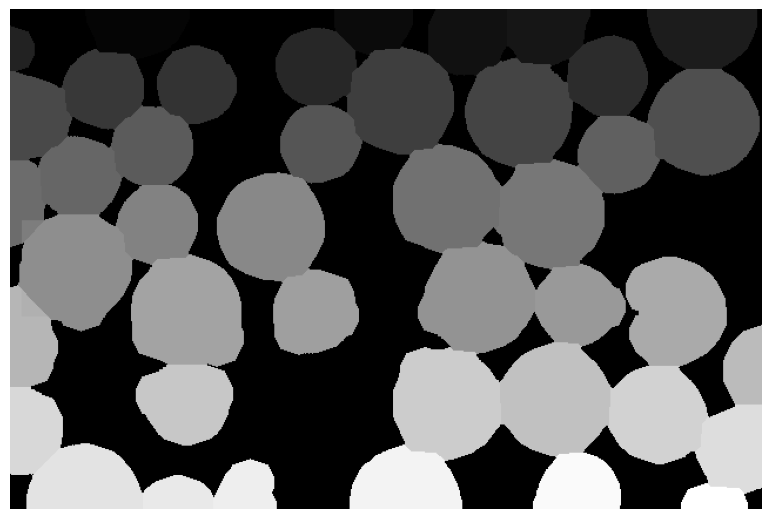

In [ ]:
watershed = get_watershed(coins_2)

Coins num: 42


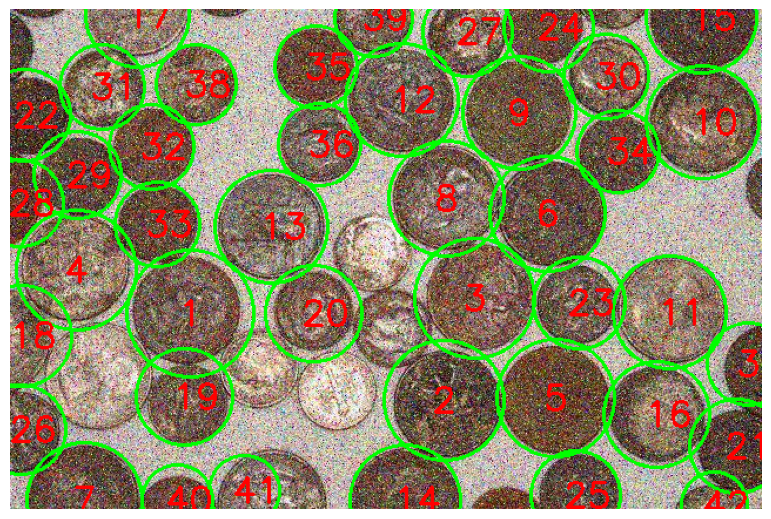

In [ ]:
draw_coins(coins_2, watershed)

# Фильтры габора

**4. (15 баллов)**  

Реализуйте функцию, которая построит банк фильтров Габора по входящим аргументам n, m.
* n – число различных частот в дипазоне (0; max_freq]
* m - число различных напралений в диапазоне [0; Pi)

Продемонструйте, что предложенные фильтры более-менее плотно заполняют частотное просранство. Для этого переведите все фильтры в частотное пространство и отобразите все их одновременно на одной картинке.

Реализуйте интерактивное demo в котром будут два слайдера, один отвечает за разные разные частоы, другой за разные направления. Выведите 3 изображения:
* Вид фильтра в пространстве изображений
* Вид Фильтра в частотном пространстве
* Результат применения фильтра к $lena.jpg$

In [ ]:
from skimage.filters import gabor_kernel

In [ ]:
lena = cv2.imread("lena.png")
lena = cv2.cvtColor(lena, cv2.COLOR_BGR2GRAY)
lena = cv2.resize(lena, (128, 128))

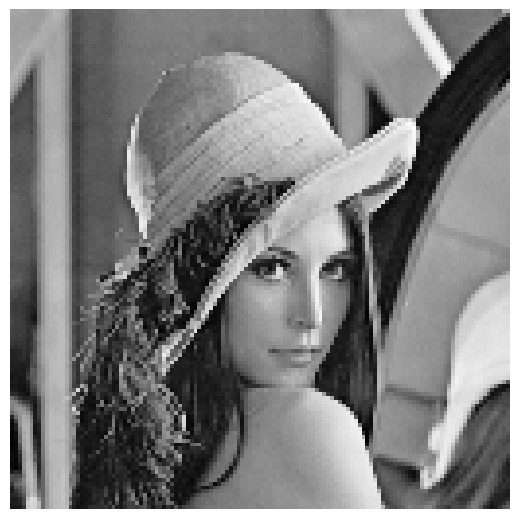

In [ ]:
show_gray(lena)

Угол = угол перпендикуляра к синусоиде

In [ ]:
def gabor_filter(size=128, freq=2**(1/2)/80, omega=np.pi/4,  phase=0, a=1/200, b=1/200):
  theta = 0
  border = size / 2
  x = np.linspace(-border, border, size)
  y = np.linspace(border, -border, size)
  xx, yy = np.meshgrid(x, y)
  # sinusoid = np.exp(1j*(2*np.pi*(freq*(xx+yy)) + phase))
  sinusoid = np.exp(1j*(2*np.pi*freq*(xx*np.cos(omega)+yy*np.sin(omega)) + phase))
  xr = xx * np.cos(theta) + yy * np.sin(theta)
  yr = -xx * np.sin(theta) + yy * np.cos(theta)
  gaussian = np.exp(-np.pi*((xr * a)**2 + (yr * b)**2))
  gabor = sinusoid * gaussian
  return gabor

In [ ]:
def gabor_filter_bank(n=5, m=5):
  omega = np.linspace(0, np.pi, m)
  freq = np.linspace(0.005, 0.05, n)
  c = 1
  fig = plt.figure(figsize=(2*n, 2*m))
  for i, f in enumerate(freq):
    for j, a in enumerate(omega):
      fig.add_subplot(n, m, c)
      gabor = np.real(gabor_filter(freq=freq[i], omega=omega[j]))
      plt.imshow(gabor, cmap='gray')
      plt.axis('off')
      plt.title(f'freq={round(freq[i], 3)}, angle={round(omega[j]*57.3, 0)}', fontsize=7)
      c += 1

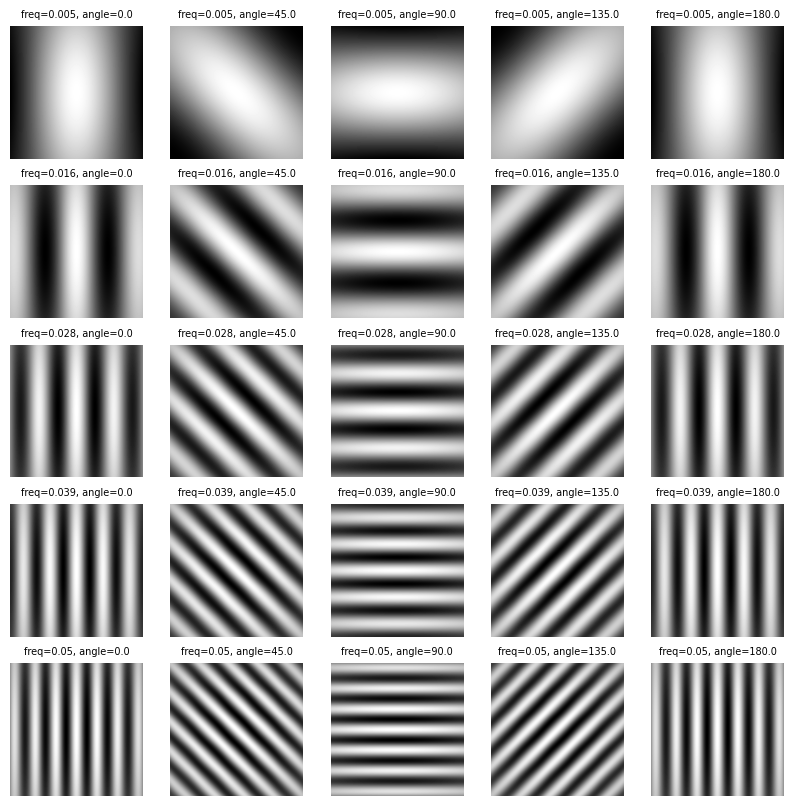

In [ ]:
gabor_filter_bank()

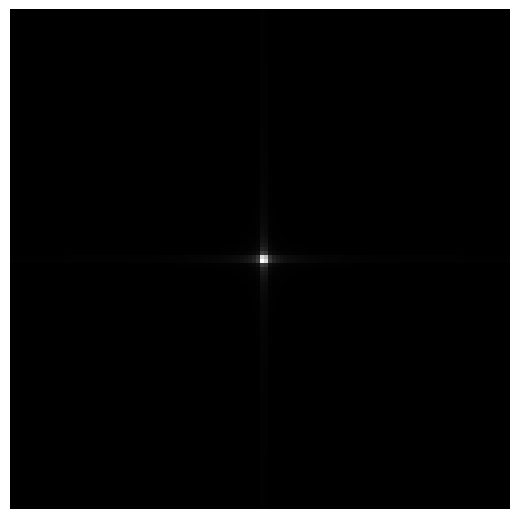

In [ ]:
my_gabor = gabor_filter(freq=0.005)
fft_my_gabor = np.fft.fft2(my_gabor)
shift_my_gabor = np.fft.fftshift(fft_my_gabor)
show_gray(np.abs(shift_my_gabor))

In [ ]:
fft_lena = np.fft.fft2(lena)
shift_lena = np.fft.fftshift(fft_lena)
filtered = shift_lena * shift_my_gabor
dft_ishift = np.fft.ifftshift(filtered)
img_back = np.fft.ifft2(dft_ishift)

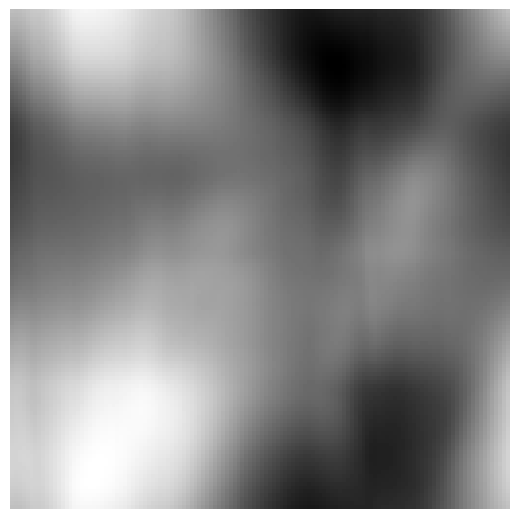

In [ ]:
show_gray(np.abs(img_back))

# Цветовые гистрограммы.

**5. (15 баллов)**

Надо реализовать функцию, которая принимет на вход:

* список дескрипторов (**id**, и сам дескриптор)
* количество максимально похожих для вывода **n**
* функцию сранения дескрипторов

и отдает **n** пар **id** максимально похожих изображений.

Посмотрите на изображения в папке *Corel* (https://drive.google.com/drive/folders/1VbLDcmDye9wqZhnS7gg5i7Rxh2Vm_73F?usp=share_link). Посчитайте гистограммы изображений. Выведите на экран 20 пар изображений с максимально похожими гистограммами, которые получаются для лучшей комбинации. В этом задании надо попробовать:
* различные цветовые пространства (RGB, HSV, CIELab)
* различные способы разбиения на бины (разное количество для каждой характеристики, joint_vs_marginal)
* различные метрики сравнения $L_2$, $\chi^2$, пересечение гистограм

Постройте сводную таблицу-отчет в которою впишите, сколько похожих пар получилось для каждого эксперимента. Проведите не менее 8 экспериментов и напишите какие-нибудь выводы

In [ ]:
from itertools import combinations

In [ ]:
path = Path("/content/drive/MyDrive/Corel")

In [ ]:
data = []
for f in path.iterdir():
    img = cv2.imread(str(f))
    data.append(img)
data = np.array(data)

(111,)


<ipython-input-784-16ae941940c9>:5: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  data = np.array(data)


In [ ]:
def make_hist(data, color_space, bins):
    res = []
    for img in data:
        if color_space == 'RGB':
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        if color_space == 'HSV':
            img = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
        if color_space == 'LAB':
            img = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)

        hist = cv2.calcHist([img], [0, 1, 2], None, [bins, bins, bins], [0, 256, 0, 256, 0, 256])
        hist = cv2.normalize(hist, None)
        res.append(hist)

    return res

In [ ]:
def best_pairs(histograms, n, compare):
    res = []
    for (i1, i2) in combinations(np.arange(len(histograms)), 2):
      res.append((compare(histograms[i1], histograms[i2]), i1, i2))
    res = sorted(res, key=lambda x: x[0])

    return res[:n]

In [ ]:
def solution(data, n=20, color_space='RGB', bins=8, compare_metric='CHISQR'):
    df = np.copy(data)
    if compare_metric == 'L2':
        compare = lambda x, y: np.linalg.norm(x - y)
    if compare_metric == 'CHISQR':
        compare = lambda x, y: cv2.compareHist(x, y, cv2.HISTCMP_CHISQR)
    if compare_metric == 'INTERSECT':
        compare = lambda x, y: cv2.compareHist(x, y, cv2.HISTCMP_INTERSECT)

    hists = make_hist(df, color_space, bins)
    return best_pairs(hists, n, compare)

In [ ]:
def show_result(data, pairs):

    def show_img(*imgs, title):

        figure = plt.figure(figsize=(10, 5))
        figure.suptitle(title)
        for i in range(1, 3):
            figure.add_subplot(1, 2, i)
            plt.axis('off')
            plt.imshow(cv2.cvtColor(imgs[i - 1], cv2.COLOR_BGR2RGB))

    for i, (v, i1, i2) in enumerate(pairs):
        show_img(data[i1], data[i2], title=f'Pair {i + 1}, distance {round(v,3)}')

Перебираем следующие параметры:

In [ ]:
color_space = ['RGB', 'HSV', 'LAB']
compare_metric = ['L2', 'CHISQR', 'INTERSECT']
bins = [8, 16, 32]

Лучший результат:

In [ ]:
pairs = solution(data, color_space='LAB', compare_metric='L2', bins=8)

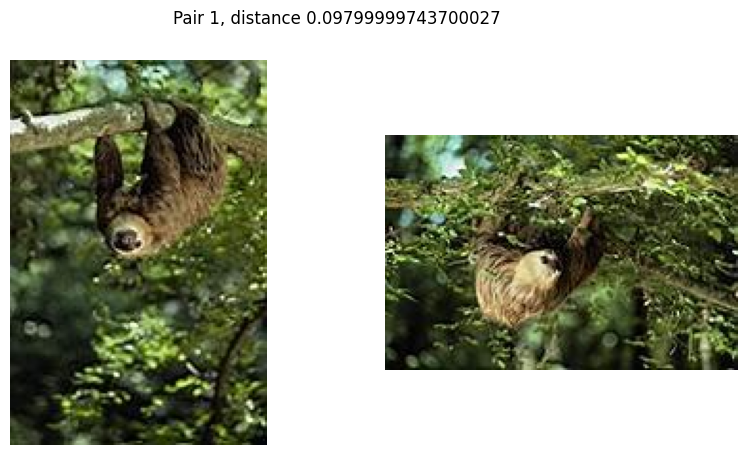

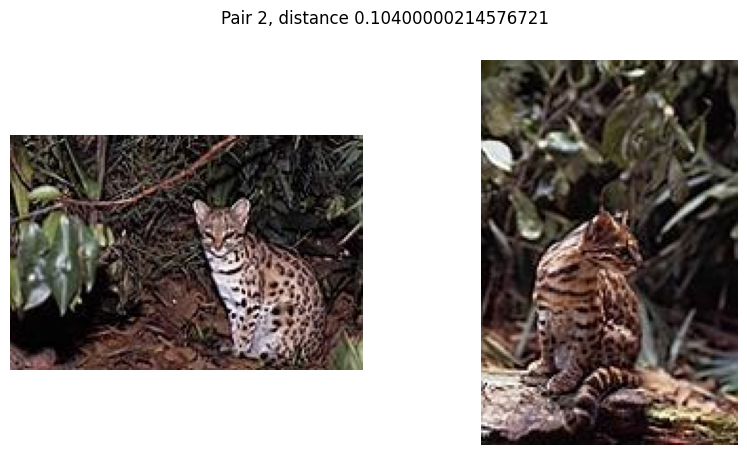

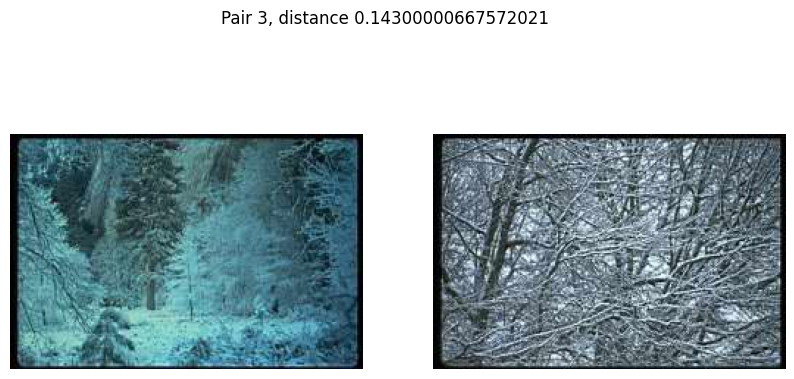

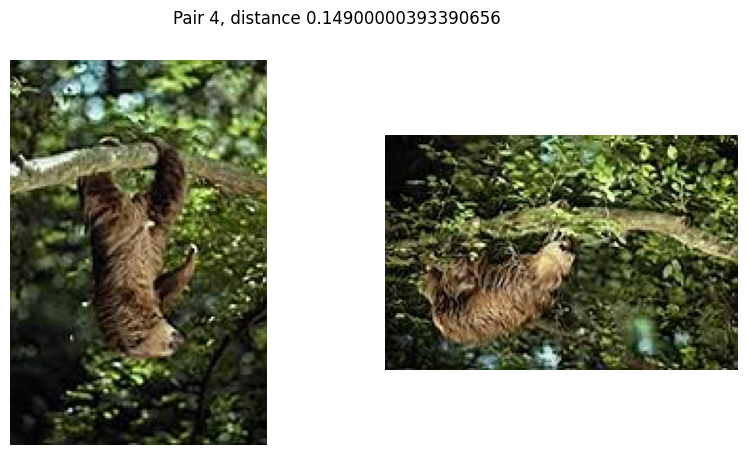

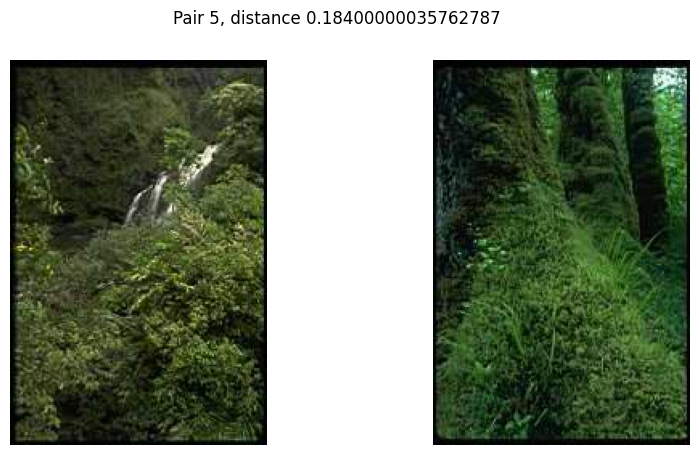

...

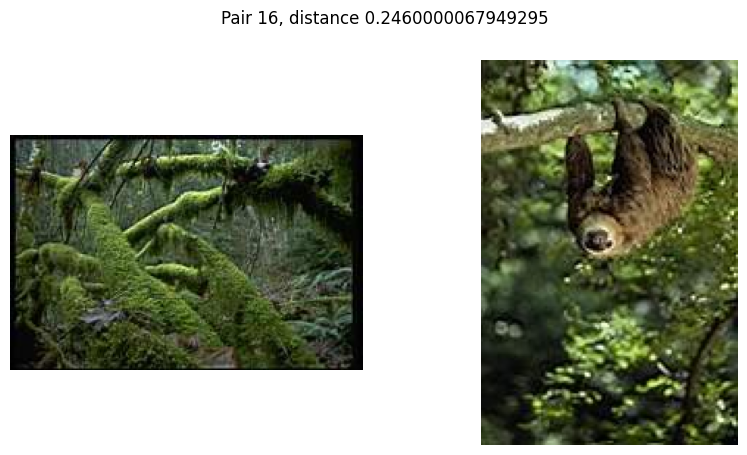

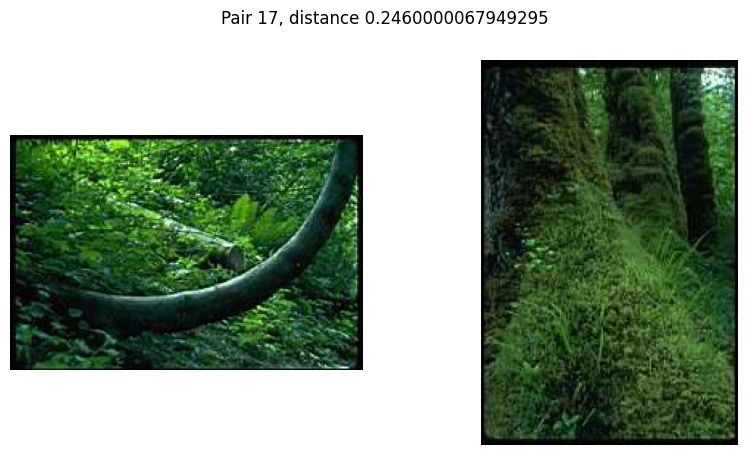

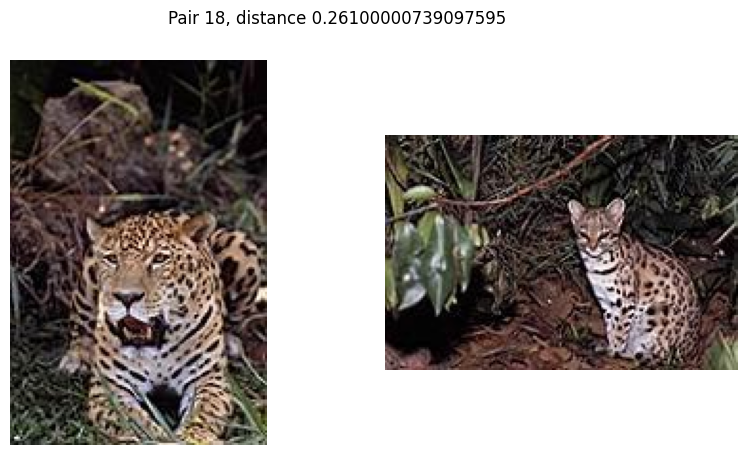

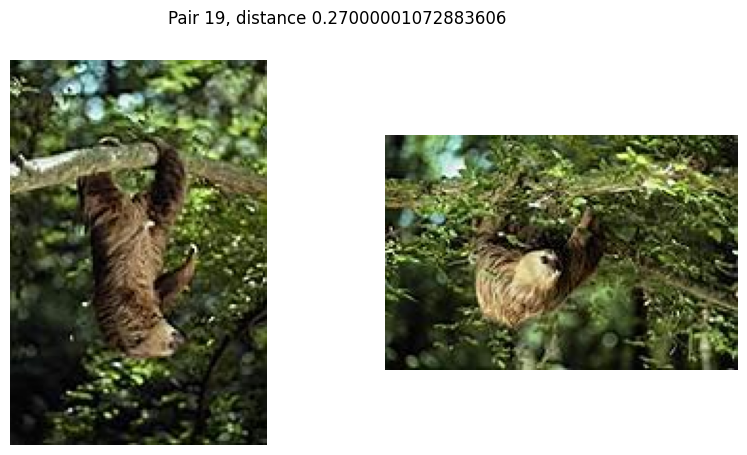

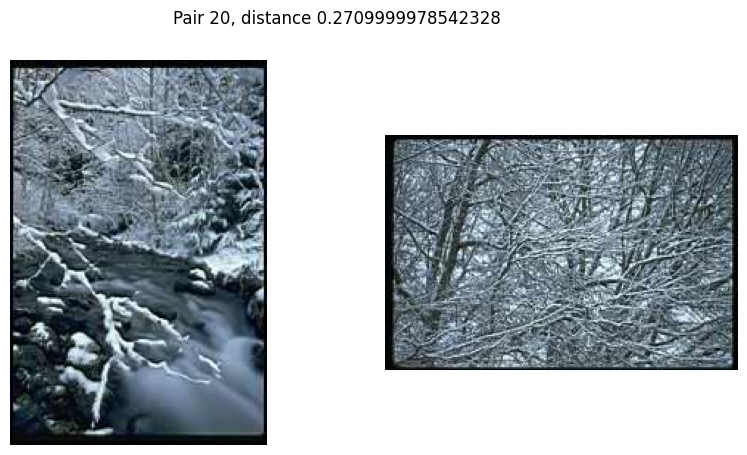

In [ ]:
show_result(data, pairs)

##Сводная таблица по результатам экспериментов:

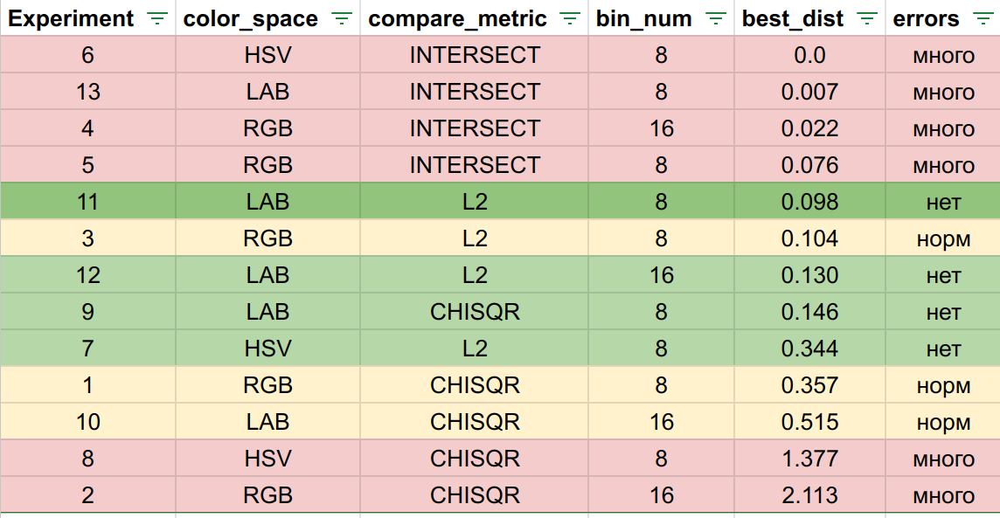

# Гистограмма градиентов

**6. (10 баллов)**

Реализуйте функцию вычисления $HOG$ дескриптора для изображения, которая принимает на вход размер сетки. Визуализируйте полученный дескриптор на изображении *susi_example.jpg* с сетками размером 10x8 и 5x4. Просканируйте скользящим окном изображение *susi_gallery.jpg* и подсветите все области, дексриптор которых поход на дескриптор *susi_example.jpg*. В идеальном случае мы должны получить 3 изображения, для которых надо подобрать порог похожести:
* Та самая вырезанная сушина.
* Все суши с креветкой.
* Все суши, которые визуально похожи на суши с креветкой.

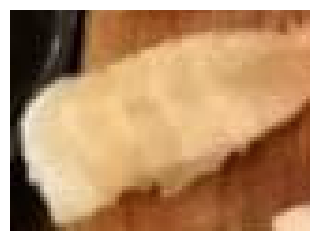

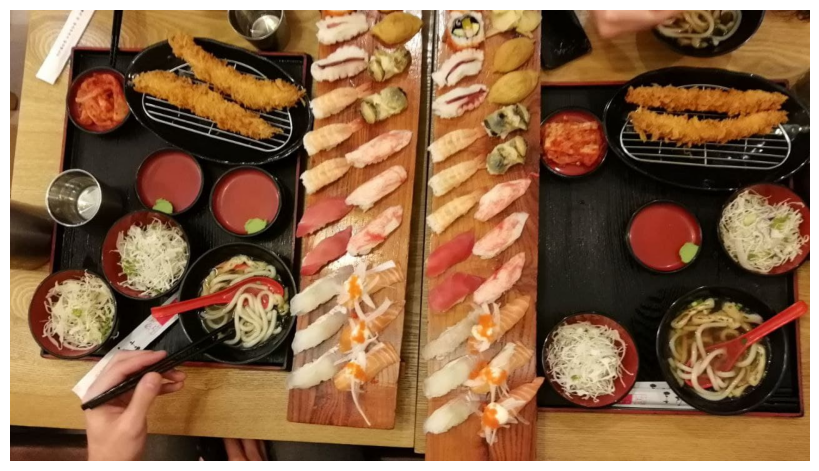

In [ ]:
susi_example = cv2.imread(str(sources_path / "susi_example.jpg"))
show_bgr(susi_example, size=(3, 4))
susi_gallery = cv2.imread(str(sources_path / "susi_gallery.jpg"))
show_bgr(susi_gallery, size=(8, 16))

In [ ]:
print(f'Shape of susi_example is {susi_example.shape}')

Shape of susi_example is (59, 80, 3)


In [ ]:
from itertools import product
import math
from tqdm.auto import tqdm

In [ ]:
def get_gradient(img):
  img = np.float32(img)
  gx = cv2.Sobel(img, cv2.CV_32F, 1, 0, ksize=3)
  gy = cv2.Sobel(img, cv2.CV_32F, 0, 1, ksize=3)
  grad_mag, grad_angle = cv2.cartToPolar(gx, gy, angleInDegrees=True)
  grad_angle %= 180
  return grad_mag, grad_angle

In [ ]:
def build_histogram(mag, angle, num_bins):
  h, w = mag.shape
  hist = np.zeros(num_bins)
  stride = 180 / num_bins
  for i, j in product(np.arange(h), np.arange(w)):
        m, a = mag[i][j], angle[i][j]
        a = a % 180
        j = math.floor(a / stride)
        val_j = m * (1 - (a - stride*j) / stride)
        hist[j] += val_j
        hist[(j+1)%num_bins] += m - val_j

  hist = cv2.normalize(hist, None)
  return hist

In [ ]:
def extract_hog(img, cell_h=10, cell_w=8, num_bins=9):
  img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  img = np.float32(img) / 255
  mag, angle = get_gradient(img)

  num_cell_h = math.ceil(img.shape[0] / cell_h)
  num_cell_w = math.ceil(img.shape[1] / cell_w)
  hog = []

  for row in range(0, num_cell_h * cell_h, cell_h):
    for col in range(0, num_cell_w * cell_w, cell_w):
      hog.append(build_histogram(mag[row:row+cell_h,col:col+cell_w],
                                 angle[row:row+cell_h, col:col+cell_w],
                                       num_bins))
  return np.array(hog)

In [ ]:
def visualize_hog(img, hog, cell_h=10, cell_w=8, num_bins=9):
  num_cell_h = math.ceil(img.shape[0] / cell_h)
  num_cell_w = math.ceil(img.shape[1] / cell_w)
  num_cells = num_cell_h * num_cell_w

  deg = np.linspace(0, 2*np.pi, 2*num_bins, endpoint = False)
  len_vecs = 2 * num_bins * num_cells

  U, V = np.zeros(len_vecs), np.zeros(len_vecs)
  X, Y = np.zeros(len_vecs), np.zeros(len_vecs)

  cnt, hog_id = 0, 0
  for row in range(0, num_cell_h * cell_h, cell_h):
    for col in range(0, num_cell_w * cell_w, cell_w):
      cur = hog[hog_id]
      hog_id += 1
      for v in range(2*num_bins):
        Y[cnt] = (cell_h / 2) + row
        X[cnt] = (cell_w / 2) + col
        U[cnt] = cur[v % num_bins] * np.cos(deg[v])
        V[cnt] = cur[v % num_bins] * np.sin(deg[v])

        cnt += 1


  plt.quiver(X, Y, U, V, color='white', scale_units = 'inches')
  plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

In [ ]:
hog = extract_hog(susi_example, 5, 4)

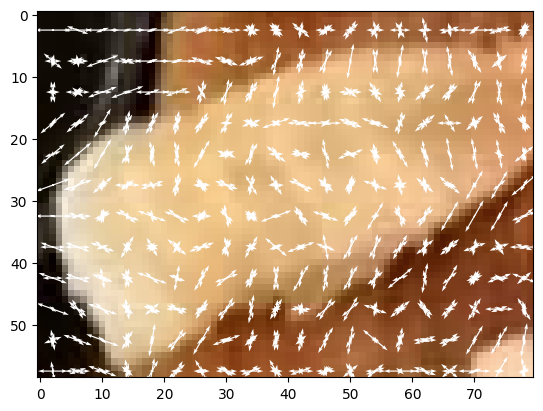

In [ ]:
visualize_hog(susi_example, hog, 5, 4)

In [ ]:
def compare_images(template, img, thresh, step):
  hog_template = extract_hog(template)
  h, w, _ = template.shape
  res = []
  res_rows = []

  for row in tqdm(range(0, img.shape[0]-h, step)):
    for col in range(0, img.shape[1]-w, step):
      hog_img = extract_hog(img[row:row+h, col:col+w])
      diff = np.linalg.norm(hog_img-hog_template)
      # diff = cv2.compareHist(hog_template, hog_img, cv2.HISTCMP_CHISQR)
      if diff < thresh:
        res.append((diff, row, col))

  res = sorted(res, key=lambda x: x[0])
  img_copy = cv2.cvtColor(np.array(img), cv2.COLOR_BGR2RGB)
  for i in range(len(res)):
    if all(abs(res[i][1] - row) > 30 for row in res_rows):
      res_rows.append(res[i][1])
      sp = (res[i][2], res[i][1])
      ep = (res[i][2] + w, res[i][1] + h)
      cv2.rectangle(img_copy, sp, ep, (0, 255, 0), thickness=2)
  plt.imshow(img_copy)
  return res

In [ ]:
bunch = susi_gallery[:, 420:880]

Та самая вырезанная сушина и все очень похожие на нее

  0%|          | 0/67 [00:00<?, ?it/s]

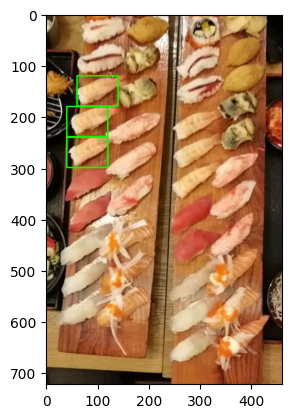

In [ ]:
res = compare_images(susi_example, bunch, thresh=5, step=10);

Ту самую сушину и все близлежащие к ней мы нашли, попробуем увеличить трешхолд


  0%|          | 0/67 [00:00<?, ?it/s]

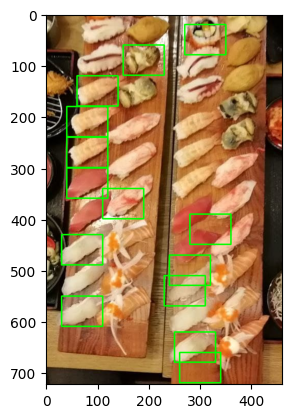

In [ ]:
res = compare_images(susi_example, bunch, thresh=10, step=10);

Поставили трешхолд повыше, однако мы все еще не смогли найти аналогичные сушины на правой досочке, плюс есть ошибки